# Background
Marine plastic pollution is a growing concern worldwide, with plastic debris contaminating our oceans and threatening marine ecosystems and human health. Identifying and quantifying the amount of plastic waste in the marine environment is a key step towards addressing this problem. In recent years, remote sensing techniques have emerged as a promising tool for detecting and monitoring plastic debris in the ocean, using satellite imagery to map the distribution of floating plastics. In this notebook, we will explore the use of the Floating Debris Index (FDI) to detect floating microplastics in Sentinel-2 satellite imagery. 

This notebook aims to detect floating microplastics using the Floating Debris Index (FDI) applied to Sentinel-2 satellite imagery. Microplastics are small plastic particles that pose a threat to marine life and human health, and their presence in water bodies has become a global environmental concern. The FDI is a spectral index that is sensitive to the presence of floating debris on the water surface, including microplastics. By applying the FDI to Sentinel-2 imagery and using a thresholding technique, we can identify and quantify the presence of microplastics in the study area. This notebook will provide a step-by-step guide on how to preprocess the data, calculate the FDI, apply thresholding techniques to detect microplastics, and generate statistics to analyze the results.

#### This notebook:

    1. Loads Sentinel-2 Level 2A data for a specific time and location
    2. Masks imagery  to the area of interest and to water bodies
    3. Normalizes the intensity of the bands
    4. Calculates the Floating Debris Index (FDI) for the NIR, red edge 2, and SWIR1 bands, 
    5. Thresholds the FDI using 3-sigma rule with a different threshold for each timestampand & plots the FDI map.
        * A single threshold for all timestamps
        * A different threshold for each timestamp
    6. Removes pixels that are classified as floating micro plastics in more than one time stamp as these are less likely to be actual microplastics
    7. Accurracy assessment

The FDI is a spectral index used to detect floating debris, such as plastics, in water bodies. It measures the contrast between the reflectance values of the water and debris in the NIR and SWIR1 bands.

# Import necessary libraries

In [1]:

# Load the necessary python packages. 
%matplotlib inline
import os
import datacube

from datetime import datetime, timedelta
from matplotlib import colors as mcolors
import seaborn as sns
import numpy as np
import xarray as xr
import geopandas as gpd
from datacube.utils import masking
import matplotlib.pyplot as plt
import xarray.plot as xplt
from rasterstats import zonal_stats
from datacube.utils.geometry import Geometry
from datacube.utils.cog import write_cog

from deafrica_tools.plotting import rgb
from deafrica_tools.plotting import display_map, map_shapefile
from deafrica_tools.bandindices import calculate_indices
from deafrica_tools.datahandling import load_ard, wofs_fuser, mostcommon_crs
from deafrica_tools.spatial import xr_rasterize
from shapely.ops import unary_union
from deafrica_tools.coastal import get_coastlines
from deafrica_tools.app import deacoastlines

from fdi_functions import *

/usr/local/lib/python3.8/dist-packages/geopandas/_compat.py:112: UserWarning: The Shapely GEOS version (3.8.0-CAPI-1.13.1 ) is incompatible with the GEOS version PyGEOS was compiled with (3.10.3-CAPI-1.16.1). Conversions between both will be slow.
  warnings.warn(


In [2]:
dc = datacube.Datacube(app='detect_microplastics')

# Load study area

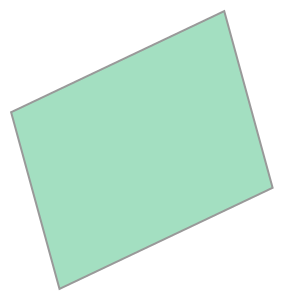

In [3]:
country = "ghana"
aoi = gpd.read_file(f"data/nasa_marine_debris_labels_{country}_bounding_box.geojson").to_crs("EPSG:6933")

geopolygon = Geometry(aoi.geometry.iloc[0], crs=aoi.crs)
geopolygon

# Load the Sentinel2 data for the area of interest and time range

In [4]:
product = 's2_l2a'
query = {
    'geopolygon': geopolygon,
    'time': ('2018-10-31','2018-11-30'),
    'output_crs': 'EPSG:6933',
    'resolution': (-10, 10),
    'measurements': ['blue', 'green', 'red','red_edge_2', 'nir', 'swir_1'],
    'group_by':"solar_day",
}

ds = dc.load(product=product, **query)
ds

<xarray.Dataset>
Dimensions:      (time: 12, y: 1633, x: 1538)
Coordinates:
  * time         (time) datetime64[ns] 2018-10-31T10:19:11 ... 2018-11-30T10:...
  * y            (y) float64 7.068e+05 7.068e+05 ... 6.905e+05 6.905e+05
  * x            (x) float64 -3.416e+04 -3.416e+04 ... -1.880e+04 -1.88e+04
    spatial_ref  int32 6933
Data variables:
    blue         (time, y, x) uint16 852 1020 1320 1630 1394 ... 380 375 356 363
    green        (time, y, x) uint16 1180 1510 1864 2096 ... 349 318 326 358
    red          (time, y, x) uint16 1430 2192 2200 2498 ... 270 278 282 273
    red_edge_2   (time, y, x) uint16 2978 2653 2653 2750 ... 288 276 276 274
    nir          (time, y, x) uint16 3194 3164 2832 2812 ... 234 236 239 230
    swir_1       (time, y, x) uint16 3112 3588 3588 3547 ... 173 173 173 179
Attributes:
    crs:           EPSG:6933
    grid_mapping:  spatial_ref

### Normalise the intensity of the bands
Normalizing the intensity of the bands used in the Floating Debris Index (FDI) is important to ensure that the FDI is not biased by differences in brightness or reflectance values across the image. Normalization helps to standardize the range of values across the bands, so that each band contributes equally to the index regardless of its original intensity values.

If the intensity values of the bands are not normalized, it can lead to inaccuracies in the FDI results, such as false positives or false negatives. For example, if one band has significantly higher intensity values than the others, it may dominate the FDI calculation and lead to an overestimation of the amount of floating debris present in the image.

By normalizing the intensity values, the FDI is calculated based on the relative differences in reflectance values between the two bands, rather than the absolute intensity values. This helps to ensure that the FDI is a more accurate indicator of the presence of floating debris, and reduces the impact of other factors that may affect the brightness or reflectance values of the image, such as cloud cover or varying illumination conditions.

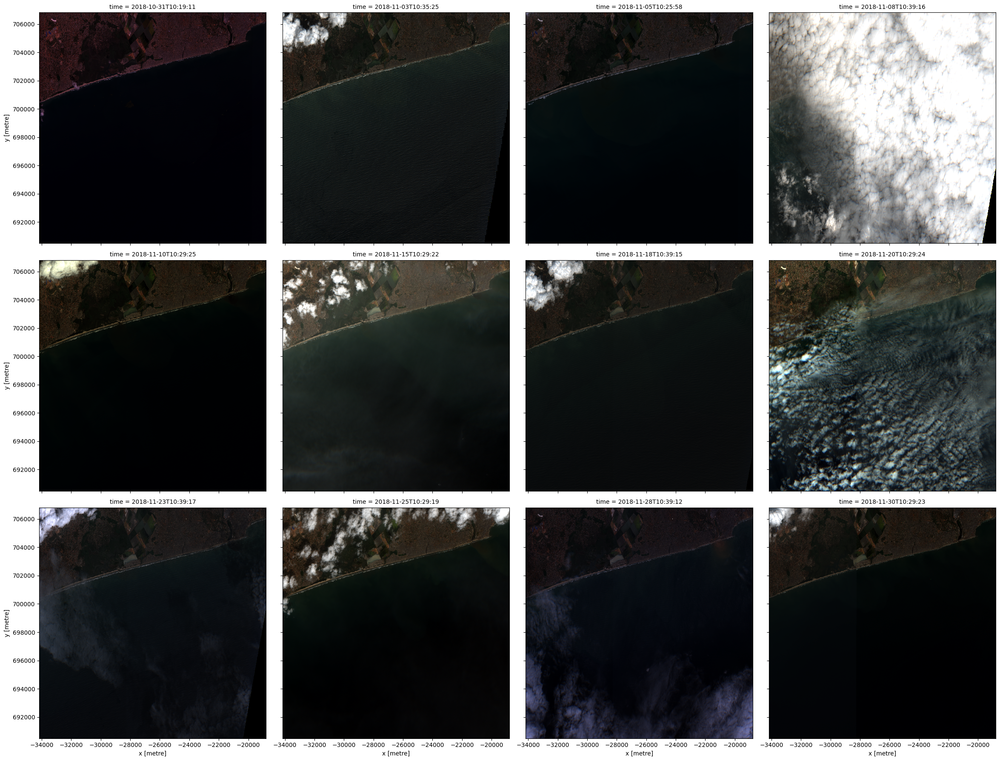

In [5]:
# Normalize the bands.
ds = normalize_intensity(ds)
rgb(ds,col="time")

In [6]:
ds

<xarray.Dataset>
Dimensions:      (time: 12, y: 1633, x: 1538)
Coordinates:
  * time         (time) datetime64[ns] 2018-10-31T10:19:11 ... 2018-11-30T10:...
  * y            (y) float64 7.068e+05 7.068e+05 ... 6.905e+05 6.905e+05
  * x            (x) float64 -3.416e+04 -3.416e+04 ... -1.880e+04 -1.88e+04
    spatial_ref  int32 6933
Data variables:
    blue         (time, y, x) float64 0.056 0.06916 ... 0.008059 0.008571
    green        (time, y, x) float64 0.0545 0.07293 ... 0.005283 0.007598
    red          (time, y, x) float64 0.1096 0.1738 0.1745 ... 0.005538 0.004899
    red_edge_2   (time, y, x) float64 0.4427 0.3929 0.3929 ... 0.004293 0.004152
    nir          (time, y, x) float64 0.2084 0.2064 0.184 ... 0.004546 0.003917
    swir_1       (time, y, x) float64 0.3986 0.4618 0.4618 ... 0.003074 0.00365
Attributes:
    crs:           EPSG:6933
    grid_mapping:  spatial_ref

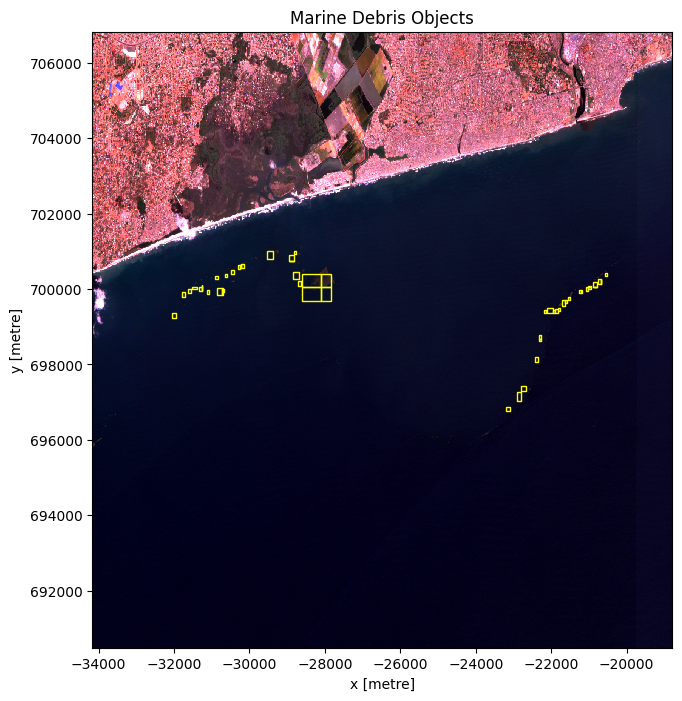

In [7]:
# Load the NASA Marine Debris Dataset for Object Detection in Planetscope Imagery dataset
marine_debris_dataset = gpd.read_file(f"data/nasa_marine_debris_labels_{country}.geojson")
marine_debris_dataset = marine_debris_dataset.to_crs('epsg:6933')


fig, ax = plt.subplots(figsize=(16, 8))
# Plot marine_debris_dataset on the second axis
rgb(ds.isel(time=0), ax=ax)
marine_debris_dataset.plot(ax=ax, facecolor='none', edgecolor='yellow')
ax.set_title('Marine Debris Objects')
# Show the plot
plt.show()


<!-- ### Calculate the Floating Debris Index (FDI) for the NIR, red edge 2, and SWIR1 bands, and plot the FDI map -->

## Mask to water using WOfS

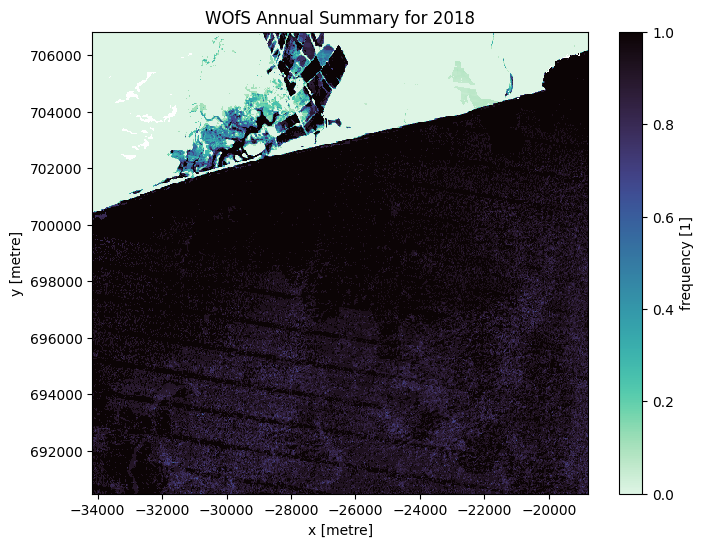

In [8]:
wofs_annual = dc.load(product='wofs_ls_summary_annual',
                      geopolygon = geopolygon,
                      resolution= (-30, 30),
                      #like=wofls.geobox,
                      time='2018')

wofs_annual.frequency.plot(size=6, cmap=sns.color_palette("mako_r", as_cmap=True))
plt.title('WOfS Annual Summary for 2018');

In [9]:
wofs_annual_wet = wofs_annual.where(wofs_annual.frequency>=0.5)
wofs_annual_wet = wofs_annual_wet.isel(time=0)
wofs_annual_wet

<xarray.Dataset>
Dimensions:      (y: 545, x: 513)
Coordinates:
    time         datetime64[ns] 2018-07-02T11:59:59.999999
  * y            (y) float64 7.068e+05 7.068e+05 ... 6.905e+05 6.905e+05
  * x            (x) float64 -3.416e+04 -3.412e+04 ... -1.882e+04 -1.88e+04
    spatial_ref  int32 6933
Data variables:
    count_wet    (y, x) float64 nan nan nan nan nan ... 14.0 15.0 15.0 13.0 13.0
    count_clear  (y, x) float64 nan nan nan nan nan ... 16.0 16.0 15.0 16.0 15.0
    frequency    (y, x) float32 nan nan nan nan nan ... 0.9375 1.0 0.8125 0.8667
Attributes:
    crs:           EPSG:6933
    grid_mapping:  spatial_ref

In [10]:
masked_ds = ds.where(wofs_annual_wet.frequency>=0.5)
masked_ds

<xarray.Dataset>
Dimensions:      (time: 12, y: 545, x: 513)
Coordinates:
  * y            (y) float64 7.068e+05 7.068e+05 ... 6.905e+05 6.905e+05
  * x            (x) float64 -3.416e+04 -3.412e+04 ... -1.882e+04 -1.88e+04
  * time         (time) datetime64[ns] 2018-10-31T10:19:11 ... 2018-11-30T10:...
    spatial_ref  int32 6933
Data variables:
    blue         (time, y, x) float64 nan nan nan ... 0.01128 0.009817 0.008571
    green        (time, y, x) float64 nan nan nan ... 0.004342 0.006947 0.007598
    red          (time, y, x) float64 nan nan nan ... 0.005254 0.004686 0.004899
    red_edge_2   (time, y, x) float64 nan nan nan ... 0.002956 0.005138 0.004152
    nir          (time, y, x) float64 nan nan nan ... 0.003637 0.004196 0.003917
    swir_1       (time, y, x) float64 nan nan nan ... 0.00365 0.003074 0.00365
Attributes:
    crs:           EPSG:6933
    grid_mapping:  spatial_ref

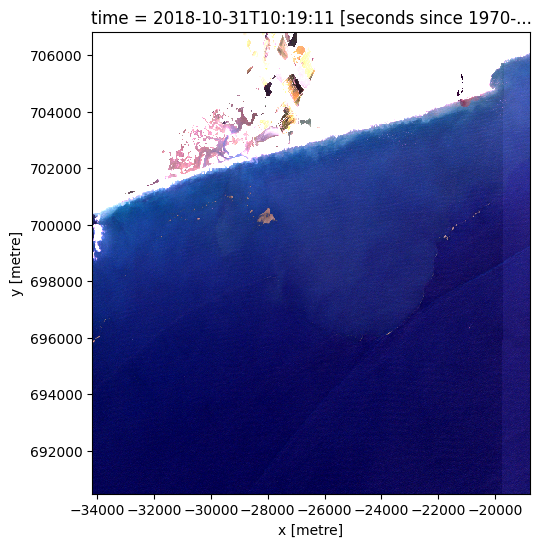

In [11]:
rgb(masked_ds.isel(time=0))

## Add DE Africa Coastlines

In [12]:
aoi2 = gpd.read_file(f"data/nasa_marine_debris_labels_{country}_bounding_box.geojson").to_crs("EPSG:4326")

# Load DE Africa Coastlines annual shorelines data.
deacl_shorelines_gdf = get_coastlines(bbox=aoi2,
                                      layer='shorelines')

# Print example output.
deacl_shorelines_gdf.head()

/usr/local/lib/python3.8/dist-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[


,id,year,certainty,tide_datum,country,geometry
36,coastlines_v0_4_0_shorelines_annual.33328,2018,unstable data,0 m AMSL,Ghana,"MULTILINESTRING ((-0.29473 5.51466, -0.29459 5..."
11,coastlines_v0_4_0_shorelines_annual.33301,2006,unstable data,0 m AMSL,Ghana,"MULTILINESTRING ((-0.34348 5.50219, -0.34339 5..."
15,coastlines_v0_4_0_shorelines_annual.33306,2008,unstable data,0 m AMSL,Ghana,"MULTILINESTRING ((-0.34267 5.50237, -0.34254 5..."
13,coastlines_v0_4_0_shorelines_annual.33304,2007,unstable data,0 m AMSL,Ghana,"MULTILINESTRING ((-0.34348 5.50217, -0.34335 5..."
31,coastlines_v0_4_0_shorelines_annual.33323,2015,unstable data,0 m AMSL,Ghana,"MULTILINESTRING ((-0.29148 5.51525, -0.29135 5..."


In [13]:
deacl_shorelines_gdf.explore(column='year', cmap='inferno', categorical=True)

In [14]:
shoreline  = deacl_shorelines_gdf[deacl_shorelines_gdf['year']== '2018']
shoreline .explore(column='year', cmap='inferno', categorical=True)

<AxesSubplot: >

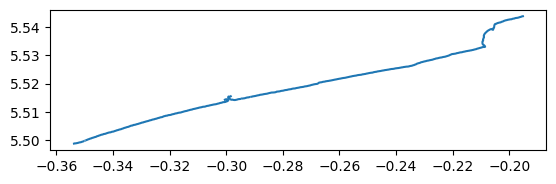

In [15]:
shoreline.plot()

### Add a buffer around the coastline and mask buffer out

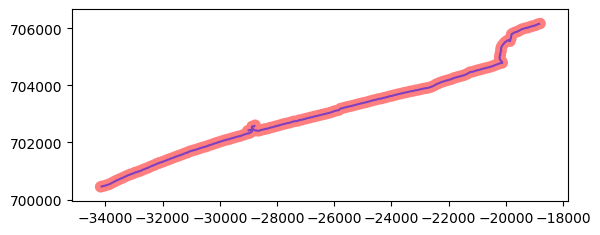

In [16]:
# Check the CRS and reproject if necessary
if shoreline.crs != 'epsg:6933':
    shoreline = shoreline.to_crs('epsg:6933')

# Combine the LineStrings into one MultiLineString
shoreline_multi_line = shoreline.geometry.unary_union

# Buffer the MultiLineString by the specified distance
buffer_distance = 200
buffered_multi_line = shoreline_multi_line.buffer(buffer_distance)

# Convert the buffered MultiLineString back to a GeoDataFrame
shoreline_buffer = gpd.GeoDataFrame(geometry=[buffered_multi_line], crs=shoreline.crs)

# Plot the original MultiLineString and the buffer
fig, ax = plt.subplots()
shoreline.plot(ax=ax, color='blue', alpha=0.5)
shoreline_buffer.plot(ax=ax, color='red', alpha=0.5)
plt.show()


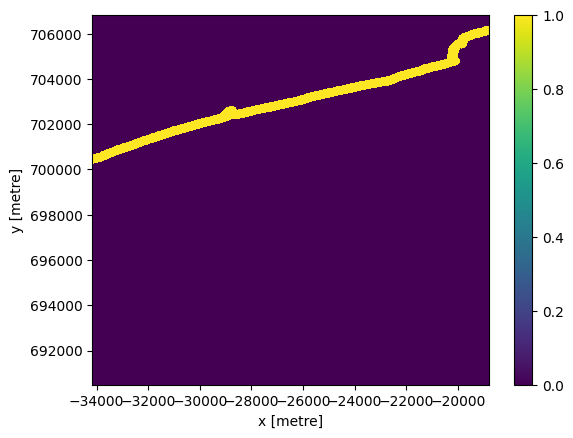

In [17]:
shoreline_raster = xr_rasterize(gdf=shoreline_buffer,
                                  da=ds,
                                  transform=ds.geobox.transform,
                                  crs=ds.crs)
shoreline_raster.plot()

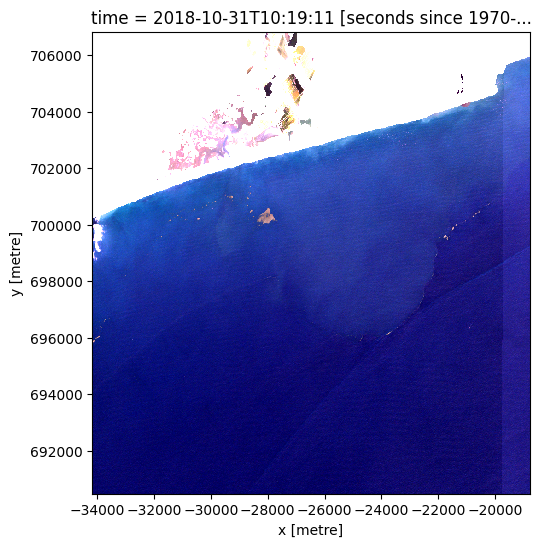

In [18]:
ds_masked_shoreline = masked_ds.where(shoreline_raster==0)
rgb(ds_masked_shoreline.isel(time=0))
# rgb(masked_ds.isel(time=0))

### Calculate and plot the Floating Debris Index (FDI)

In [19]:
wavelength_nir = 842 * 1e-9
wavelength_red = 665 * 1e-9
wavelength_swir1 = 1610 * 1e-9

ds_masked_shoreline["FDI"] = ds_masked_shoreline.nir - (ds_masked_shoreline.red_edge_2 + (ds_masked_shoreline.swir_1 - ds_masked_shoreline.red_edge_2) * ((wavelength_nir - wavelength_red) / (wavelength_swir1 - wavelength_red)) * 10)
ds

<xarray.Dataset>
Dimensions:      (time: 12, y: 1633, x: 1538)
Coordinates:
  * time         (time) datetime64[ns] 2018-10-31T10:19:11 ... 2018-11-30T10:...
  * y            (y) float64 7.068e+05 7.068e+05 ... 6.905e+05 6.905e+05
  * x            (x) float64 -3.416e+04 -3.416e+04 ... -1.880e+04 -1.88e+04
    spatial_ref  int32 6933
Data variables:
    blue         (time, y, x) float64 0.056 0.06916 ... 0.008059 0.008571
    green        (time, y, x) float64 0.0545 0.07293 ... 0.005283 0.007598
    red          (time, y, x) float64 0.1096 0.1738 0.1745 ... 0.005538 0.004899
    red_edge_2   (time, y, x) float64 0.4427 0.3929 0.3929 ... 0.004293 0.004152
    nir          (time, y, x) float64 0.2084 0.2064 0.184 ... 0.004546 0.003917
    swir_1       (time, y, x) float64 0.3986 0.4618 0.4618 ... 0.003074 0.00365
Attributes:
    crs:           EPSG:6933
    grid_mapping:  spatial_ref

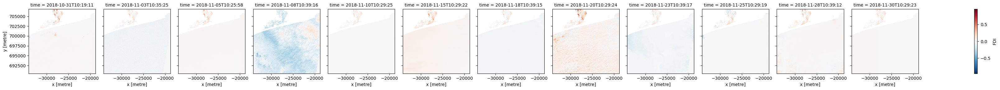

In [20]:
affine = ds_masked_shoreline.geobox.affine
crs = ds_masked_shoreline.geobox.crs

ds_fdi = ds_masked_shoreline["FDI"].squeeze()
ds_fdi.plot(cmap="RdBu_r", col='time')

## Select and apply threshold
The best threshold for identifying microplastics from the FDI will depend on the characteristics of your data and the specific application you are working on.

One way to determine the best threshold is to create a histogram of the FDI values and visually inspect it to identify a threshold value that separates the distribution into two distinct groups, one representing microplastics and the other representing non-microplastics.

### Single threshold
The 3-sigma rule is a statistical method used to determine if a data point is an outlier, which means it is significantly different from the other data points. In this case, we used it to identify pixels in the satellite imagery that were likely to be microplastics.

To do this, we first calculated the mean and standard deviation of the FDI values for all pixels in the satellite imagery. We then set a threshold at 3 standard deviations above the mean, which means any pixel with an FDI value above this threshold was classified as a microplastic.


In [21]:
# get FDI values and remove missing values
fdi_values = ds_fdi.values.ravel()
fdi_values = fdi_values[~np.isnan(fdi_values)]

# calculate threshold
single_threshold = np.mean(fdi_values) + (3 * np.std(fdi_values))

print(single_threshold)


0.1728845881606314


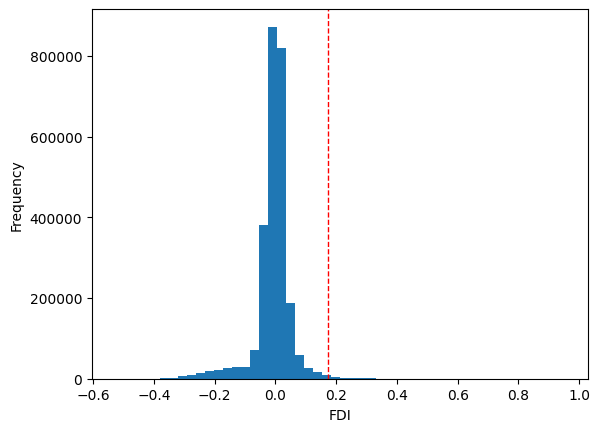

In [22]:
# Create a histogram of the FDI values
plt.hist(ds_fdi.values.ravel(), bins=50)
plt.axvline(single_threshold, color='red', linestyle='dashed', linewidth=1)
plt.xlabel('FDI')
plt.ylabel('Frequency')
plt.show()

Microplastic area for time 2018-10-31T10:19:11.000000000: 1.3032 square kilometers
Microplastic area for time 2018-11-03T10:35:25.000000000: 0.3474 square kilometers
Microplastic area for time 2018-11-05T10:25:58.000000000: 0.6669 square kilometers
Microplastic area for time 2018-11-08T10:39:16.000000000: 0.1089 square kilometers
Microplastic area for time 2018-11-10T10:29:25.000000000: 0.2682 square kilometers
Microplastic area for time 2018-11-15T10:29:22.000000000: 1.485 square kilometers
Microplastic area for time 2018-11-18T10:39:15.000000000: 0.3411 square kilometers
Microplastic area for time 2018-11-20T10:29:24.000000000: 6.8301 square kilometers
Microplastic area for time 2018-11-23T10:39:17.000000000: 0.3168 square kilometers
Microplastic area for time 2018-11-25T10:29:19.000000000: 0.5454 square kilometers
Microplastic area for time 2018-11-28T10:39:12.000000000: 1.0557 square kilometers
Microplastic area for time 2018-11-30T10:29:23.000000000: 0.4023 square kilometers


Text(0.5, 0.98, 'Microplastic Masks')

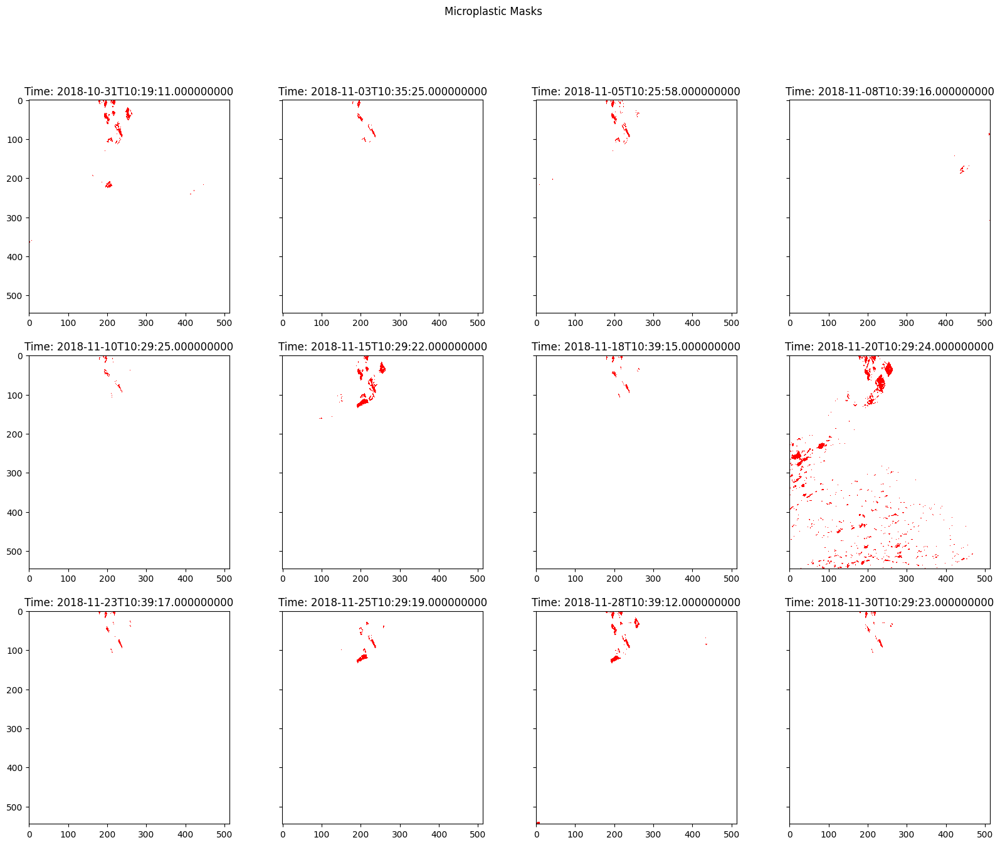

In [23]:
# Create custom colormap
cmap = mcolors.ListedColormap(['white', 'red'])

# Determine the number of columns to use for the subplots
n_cols = len(ds_fdi.time.values)
n_rows = int(np.ceil(n_cols / 4))  # calculate the number of rows

# Create a new figure and axis object with multiple rows and columns
fig, axs = plt.subplots(n_rows, 4, figsize=(20, n_rows*5), sharey=True)

# Initialize a list to store the microplastic areas for each time stamp
microplastic_areas = []

# Initialize a list to store the number of microplastics for each time stamp
num_microplastics = []

# Iterate over each time step in the ds_fdi dataset
for i, time_step in enumerate(ds_fdi.time.values):
    # Create a binary mask for the current time step
    mask = ds_fdi.isel(time=i) >= single_threshold
    mask = mask.astype(int)

    # Compute the area of microplastics within the area of interest for the current time step
    pixel_area = abs(affine[0]) ** 2
    microplastic_area = mask.sum() * pixel_area
    microplastic_areas.append(microplastic_area)

    print(f"Microplastic area for time {time_step}: {float(microplastic_area) / 1e6} square kilometers")
    
    # Compute the number of microplastics within the area of interest for the current time step
    num_microplastics.append(mask.sum())

    # Plot the mask for the current time step on the appropriate subplot
    row_idx = i // 4  # calculate the row index
    col_idx = i % 4  # calculate the column index
    axs[row_idx, col_idx].imshow(mask, cmap=cmap)
    axs[row_idx, col_idx].set_title(f'Time: {time_step}')

# Remove any unused subplots
for i in range(n_rows * 4 - n_cols):
    row_idx = n_rows - 1  # start from the last row
    col_idx = n_cols % 4 + i  # fill in the unused columns in the last row
    axs[row_idx, col_idx].remove()

fig.suptitle('Microplastic Masks')


#### Graph of total area and number of microplastic objects for each time stamp

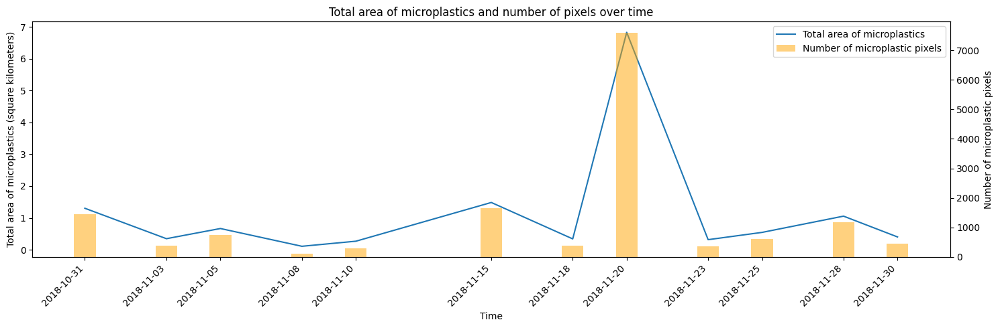

In [24]:
# Create a new figure for the microplastic area and number of objects graph
fig, ax = plt.subplots(figsize=(15, 5))

# Plot the total area of microplastics over time
plt.plot(ds_fdi.time.values, np.array(microplastic_areas) / 1e6, label='Total area of microplastics')
ax.set_xlabel('Time')
ax.set_ylabel('Total area of microplastics (square kilometers)')
ax.set_title('Total area of microplastics and number of pixels over time')

# Create a twin axes object for the bar graph
ax2 = ax.twinx()

# Plot the total number of microplastic objects over time
ax2.bar(ds_fdi.time.values, num_microplastics, alpha=0.5, color='orange', label='Number of microplastic pixels')
ax2.set_ylabel('Number of microplastic pixels')

# Set the x-ticks to be the same for both plots
ax.set_xticks(ds_fdi.time.values)
ax2.set_xticks(ds_fdi.time.values)

# Rotate the x-axis tick labels for better readability
plt.setp(ax.get_xticklabels(), rotation=45, ha='right')
plt.setp(ax2.get_xticklabels(), rotation=45, ha='right')

# Add a legend to the plot
lines, labels = ax.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax2.legend(lines + lines2, labels + labels2, loc='upper right')

# Adjust the layout of the subplots
fig.tight_layout()

# Show the plot
plt.show()


###  Threshold for each timestamp
The 3-sigma rule is a statistical method used to determine if a data point is an outlier, which means it is significantly different from the other data points. In this case, we used it to identify pixels in the satellite imagery that were likely to be microplastics.

To do this, we first calculated the mean and standard deviation of the FDI values for all pixels in the satellite imagery. We then set a threshold at 3 standard deviations above the mean, which means any pixel with an FDI value above this threshold was classified as a microplastic.


In [25]:
# get FDI values
fdi_values = ds_fdi.values

# calculate threshold for each timestamp
threshold_per_timestamp = []
for i in range(fdi_values.shape[0]):
    # remove missing values for this timestamp
    fdi_values_i = fdi_values[i, :]
    fdi_values_i = fdi_values_i[~np.isnan(fdi_values_i)]
    
    # calculate threshold for this timestamp
    threshold_i = np.mean(fdi_values_i) + (3 * np.std(fdi_values_i))
    threshold_per_timestamp.append(threshold_i)
threshold_per_timestamp

[0.09582662296991117,
 0.03875237499671536,
 0.07414555693761007,
 0.16620675916125202,
 0.04354511871059178,
 0.11974533065617979,
 0.031827469156421075,
 0.24219878581510285,
 0.06180190239462264,
 0.07233160378680824,
 0.09315940833535236,
 0.05588003215412013]

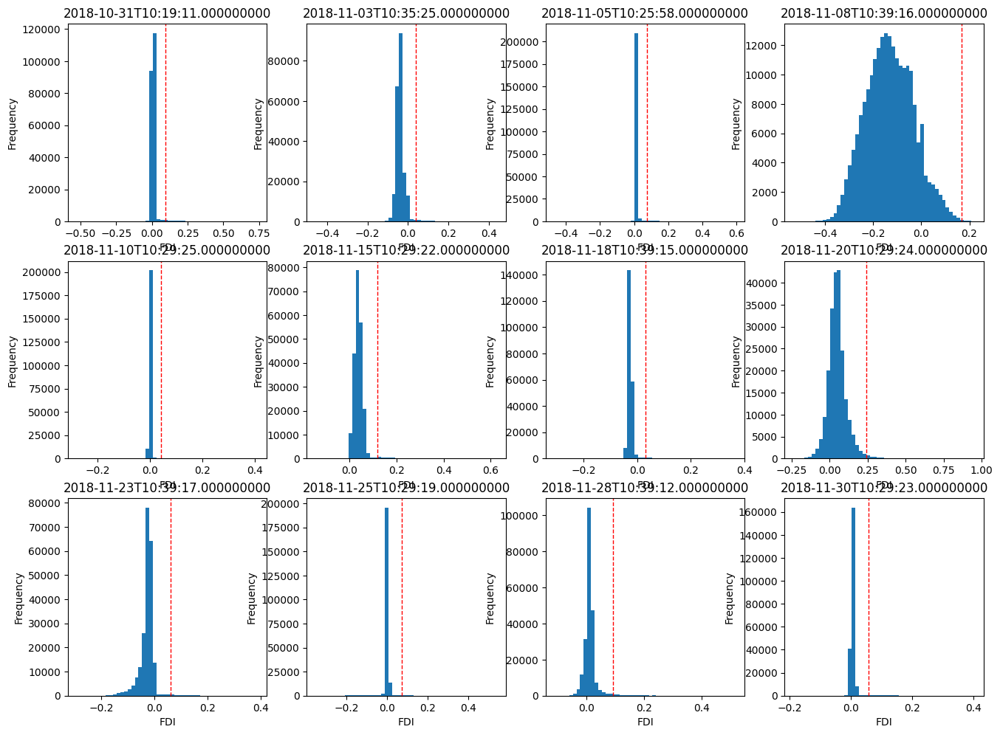

In [26]:
num_cols = 4
num_rows = int(np.ceil(fdi_values.shape[0] / num_cols))
fig, axs = plt.subplots(nrows=num_rows+1, ncols=num_cols, figsize=(16, 4*(num_rows+1)))
for i, time_step in enumerate(ds_fdi.time.values):
    # remove missing values for this time step
    fdi_values_i = fdi_values[i, :]
    fdi_values_i = fdi_values_i[~np.isnan(fdi_values_i)]
    
    # plot histogram
    row_idx = i // num_cols
    col_idx = i % num_cols
    axs[row_idx, col_idx].hist(fdi_values_i, bins=50)
    axs[row_idx, col_idx].axvline(threshold_per_timestamp[i], color='r', linestyle='dashed', linewidth=1)
    axs[row_idx, col_idx].set_xlabel('FDI')
    axs[row_idx, col_idx].set_ylabel('Frequency')
    axs[row_idx, col_idx].set_title(f'{time_step}')

# remove any extra empty subplots
if i < num_cols * (num_rows+1) - 1:
    for j in range(i+1, num_cols * (num_rows+1)):
        fig.delaxes(axs.flatten()[j])

plt.show()


Microplastic area for time 2018-10-31T10:19:11.000000000: 2.7441 square kilometers
Microplastic area for time 2018-11-03T10:35:25.000000000: 2.6478 square kilometers
Microplastic area for time 2018-11-05T10:25:58.000000000: 3.0402 square kilometers
Microplastic area for time 2018-11-08T10:39:16.000000000: 0.144 square kilometers
Microplastic area for time 2018-11-10T10:29:25.000000000: 2.7279 square kilometers
Microplastic area for time 2018-11-15T10:29:22.000000000: 3.0123 square kilometers
Microplastic area for time 2018-11-18T10:39:15.000000000: 2.9016 square kilometers
Microplastic area for time 2018-11-20T10:29:24.000000000: 2.0367 square kilometers
Microplastic area for time 2018-11-23T10:39:17.000000000: 1.9629 square kilometers
Microplastic area for time 2018-11-25T10:29:19.000000000: 1.8171 square kilometers
Microplastic area for time 2018-11-28T10:39:12.000000000: 3.2985 square kilometers
Microplastic area for time 2018-11-30T10:29:23.000000000: 2.4579 square kilometers


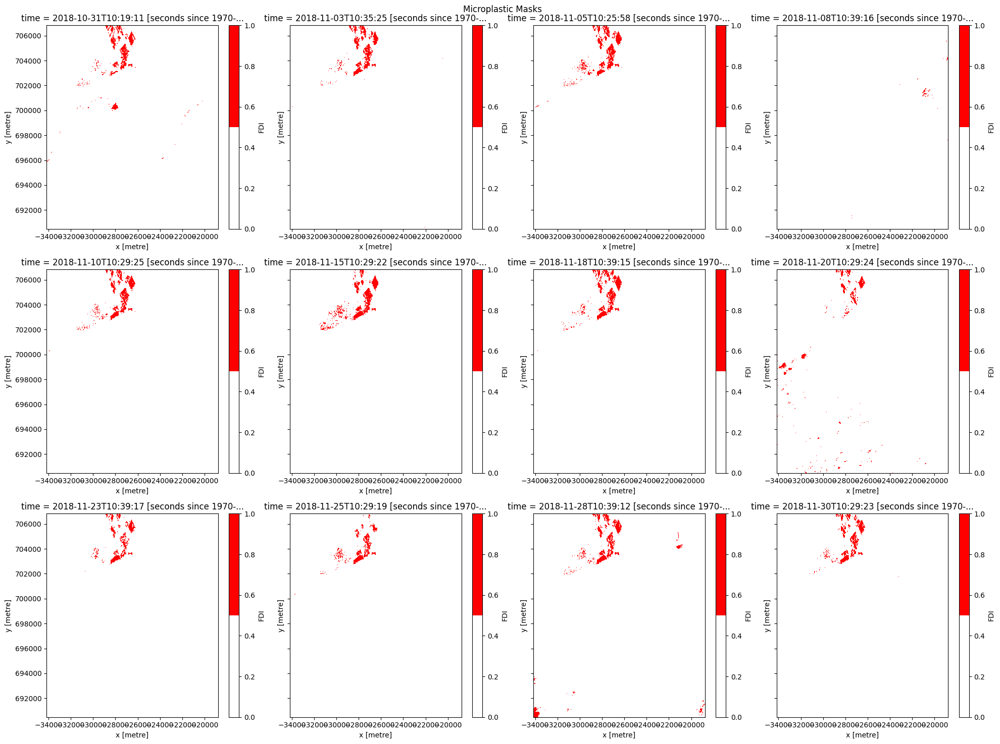

In [27]:
# Create custom colormap
cmap = mcolors.ListedColormap(['white', 'red'])

# Determine the number of columns to use for the subplots
n_cols = 4
n_rows = int(np.ceil(len(ds_fdi.time.values) / n_cols))

# Create a new figure and axis object with multiple rows and columns
fig, axs = plt.subplots(n_rows, n_cols, figsize=(n_cols*5, n_rows*5), sharey=True)

# Initialize a list to store the microplastic areas for each time stamp
microplastic_areas = []

# Initialize a list to store the number of microplastics for each time stamp
num_microplastics = []

# Iterate over each time step in the ds_fdi dataset
for i, time_step in enumerate(ds_fdi.time.values):
    # Get the threshold for this time step
    threshold = threshold_per_timestamp[i]

    # Create a binary mask for the current time step
    mask = ds_fdi.isel(time=i) >= threshold
    mask = mask.astype(int)

    # Calculate the subplot indices
    row_index = i // n_cols
    col_index = i % n_cols

    # Plot the mask for the current time step on the appropriate subplot
    mask.plot(ax=axs[row_index, col_index], cmap=cmap,)

    # Compute the area of microplastics within the area of interest for the current time step
    pixel_area = abs(affine[0]) ** 2
    microplastic_area = mask.sum() * pixel_area
    microplastic_areas.append(microplastic_area)

    print(f"Microplastic area for time {time_step}: {float(microplastic_area) / 1e6} square kilometers")
    
    # Compute the number of microplastics within the area of interest for the current time step
    num_microplastics.append(mask.sum())

    fig.suptitle('Microplastic Masks')

# Remove any unused subplots
for i in range(len(ds_fdi.time.values), n_rows*n_cols):
    row_index = i // n_cols
    col_index = i % n_cols
    axs[row_index, col_index].axis('off')

# Adjust the spacing between subplots
fig.tight_layout()


#### Graph of total area and number of microplastic objects for each time stamp

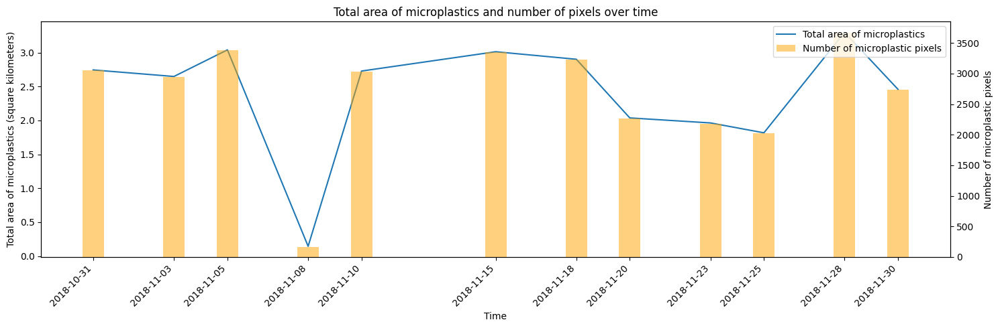

In [28]:
# Create a new figure for the microplastic area and number of objects graph
fig, ax = plt.subplots(figsize=(15, 5))

# Plot the total area of microplastics over time
plt.plot(ds_fdi.time.values, np.array(microplastic_areas) / 1e6, label='Total area of microplastics')
ax.set_xlabel('Time')
ax.set_ylabel('Total area of microplastics (square kilometers)')
ax.set_title('Total area of microplastics and number of pixels over time')

# Create a twin axes object for the bar graph
ax2 = ax.twinx()

# Plot the total number of microplastic objects over time
ax2.bar(ds_fdi.time.values, num_microplastics, alpha=0.5, color='orange', label='Number of microplastic pixels')
ax2.set_ylabel('Number of microplastic pixels')

# Set the x-ticks to be the same for both plots
ax.set_xticks(ds_fdi.time.values)
ax2.set_xticks(ds_fdi.time.values)

# Rotate the x-axis tick labels for better readability
plt.setp(ax.get_xticklabels(), rotation=45, ha='right')
plt.setp(ax2.get_xticklabels(), rotation=45, ha='right')

# Add a legend to the plot
lines, labels = ax.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax2.legend(lines + lines2, labels + labels2, loc='upper right')

# Adjust the layout of the subplots
fig.tight_layout()

# Show the plot
plt.show()


## Remove microplastic areas that exist in any other timestamp
If pixels are classified as microplastics in more than one timeframe, they are more likely to be artifacts on the ground and not floating microplastics (as these move)

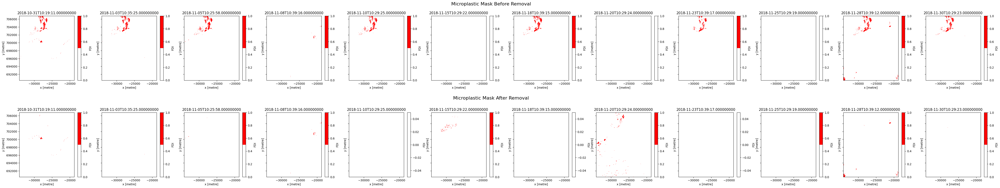

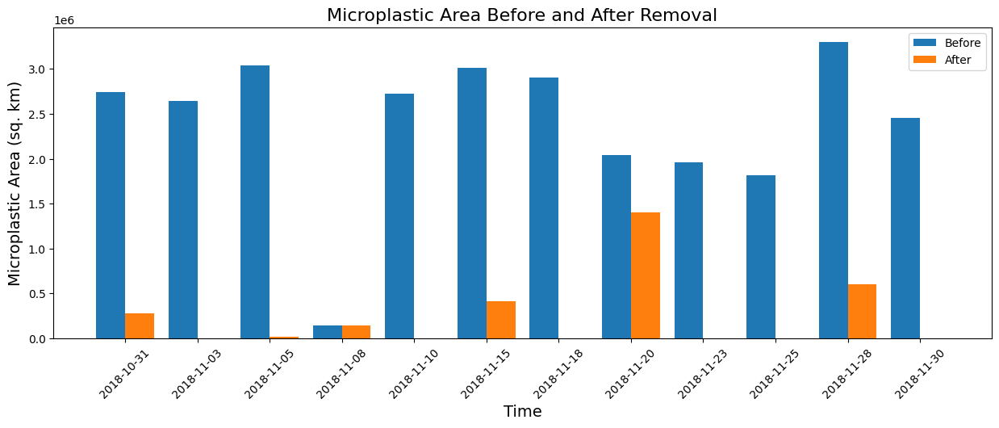

In [29]:

# Create custom colormap
cmap = mcolors.ListedColormap(['white', 'red'])

# Determine the number of columns to use for the subplots
n_cols = len(ds_fdi.time.values)

# Create a new figure and axis object with subplots for before and after microplastic removal
fig, axs = plt.subplots(2, n_cols, figsize=(n_cols*5, 10), sharey=True)

# Set the space between the two sets of plots
fig.subplots_adjust(hspace=0.5)

# Add a header to the top of the before subplots
fig.text(0.5, 0.93, 'Microplastic Mask Before Removal', ha='center', fontsize=16)

# Add a header to the top of the after subplots
fig.text(0.5, 0.48, 'Microplastic Mask After Removal', ha='center', fontsize=16)


# Initialize lists to store the microplastic areas for each time stamp
microplastic_areas_before = []
microplastic_areas_after = []

# Iterate over each time step in the ds_fdi dataset
for i, time_step in enumerate(ds_fdi.time.values):
    threshold = threshold_per_timestamp[i]
    # Create a binary mask for the current time step
    mask_before = ds_fdi.isel(time=i) >= threshold
    mask_before = mask_before.astype(int)

    # Plot the mask before removing microplastics that exist in more than one timestamp
    mask_before.plot(ax=axs[0,i], cmap=cmap)
    axs[0,i].set_title(f"{time_step}")
    
    # Remove microplastic areas that exist in any other timestamp
    mask_after = mask_before.copy()
    for j in range(len(ds_fdi.time.values)):
        if j == i:
            continue
        overlap = (ds_fdi.isel(time=j) >= threshold) & mask_after
        overlap_area = overlap.sum() * pixel_area
        if overlap_area > 0:
            mask_after = mask_after - overlap

    # Plot the mask after removing microplastics that exist in more than one timestamp
    # Only plot red if there are microplastics left after the removal
    if mask_after.sum() > 0:
        cmap = mcolors.ListedColormap(['white', 'red'])
    else:
        cmap = mcolors.ListedColormap(['white'])
    mask_after.plot(ax=axs[1,i], cmap=cmap)
    axs[1,i].set_title(f"{time_step}")

    # Compute the area of microplastics within the area of interest for the current time step
    pixel_area = abs(affine[0]) ** 2
    microplastic_area_before = mask_before.sum() * pixel_area
    microplastic_area_after = mask_after.sum() * pixel_area
    microplastic_areas_before.append(microplastic_area_before)
    microplastic_areas_after.append(microplastic_area_after)


# Create bar plot of microplastic areas for each time stamp
fig, ax = plt.subplots(figsize=(15, 5))
width = 0.4
ind = np.arange(len(ds_fdi.time.values))
plt.bar(ind, microplastic_areas_before, width, label='Before')
plt.bar(ind + width, microplastic_areas_after, width, label='After')
plt.title('Microplastic Area Before and After Removal', fontsize=16)
plt.xlabel('Time', fontsize=14)
plt.ylabel('Microplastic Area (sq. km)', fontsize=14)
plt.xticks(ind + width / 2, [str(d)[:10] for d in ds_fdi.time.values], rotation=45)
plt.legend()
plt.show()


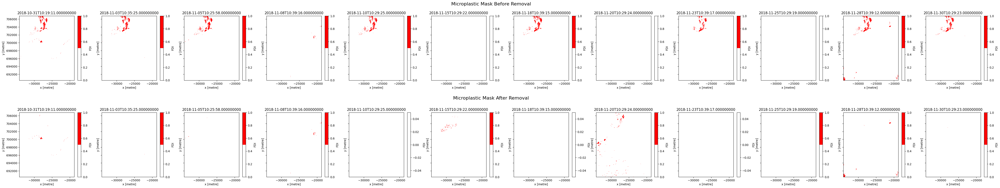

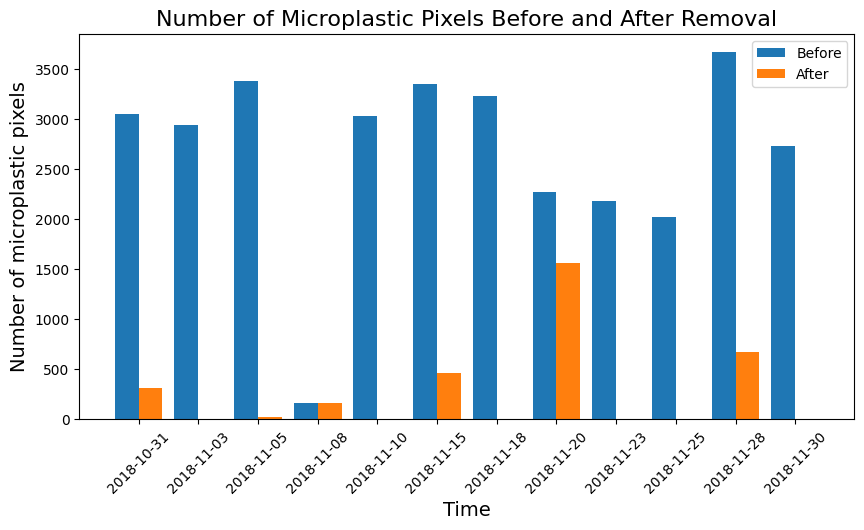

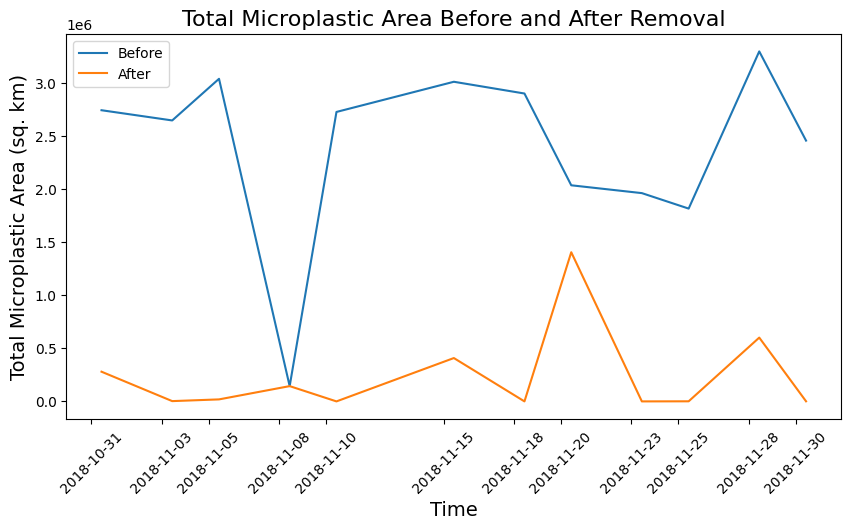

In [30]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import numpy as np

# Create custom colormap
cmap = mcolors.ListedColormap(['white', 'red'])

# Determine the number of columns to use for the subplots
n_cols = len(ds_fdi.time.values)

# Create a new figure and axis object with subplots for before and after microplastic removal
fig, axs = plt.subplots(2, n_cols, figsize=(n_cols*5, 10), sharey=True)

# Set the space between the two sets of plots
fig.subplots_adjust(hspace=0.5)

# Add a header to the top of the before subplots
fig.text(0.5, 0.93, 'Microplastic Mask Before Removal', ha='center', fontsize=16)

# Add a header to the top of the after subplots
fig.text(0.5, 0.48, 'Microplastic Mask After Removal', ha='center', fontsize=16)


# Initialize lists to store the microplastic areas for each time stamp
microplastic_areas_before = []
microplastic_areas_after = []

# Initialize lists to store the number of microplastics for each time stamp
num_microplastics_before = []
num_microplastics_after = []

# Iterate over each time step in the ds_fdi dataset
for i, time_step in enumerate(ds_fdi.time.values):
    threshold = threshold_per_timestamp[i]
    # Create a binary mask for the current time step
    mask_before = ds_fdi.isel(time=i) >= threshold
    mask_before = mask_before.astype(int)

    # Plot the mask before removing microplastics that exist in more than one timestamp
    mask_before.plot(ax=axs[0,i], cmap=cmap)
    axs[0,i].set_title(f"{time_step}")
    
    # Remove microplastic areas that exist in any other timestamp
    mask_after = mask_before.copy()
    for j in range(len(ds_fdi.time.values)):
        if j == i:
            continue
        overlap = (ds_fdi.isel(time=j) >= threshold) & mask_after
        overlap_area = overlap.sum() * pixel_area
        if overlap_area > 0:
            mask_after = mask_after - overlap

    # Plot the mask after removing microplastics that exist in more than one timestamp
    # Only plot red if there are microplastics left after the removal
    if mask_after.sum() > 0:
        cmap = mcolors.ListedColormap(['white', 'red'])
    else:
        cmap = mcolors.ListedColormap(['white'])
    mask_after.plot(ax=axs[1,i], cmap=cmap)
    axs[1,i].set_title(f"{time_step}")

    # Compute the area of microplastics within the area of interest for the current time step
    pixel_area = abs(affine[0]) ** 2
    microplastic_area_before = mask_before.sum() * pixel_area
    microplastic_area_after = mask_after.sum() * pixel_area
    microplastic_areas_before.append(microplastic_area_before)
    microplastic_areas_after.append(microplastic_area_after)
    
    # Count the number of microplastics for the current time step
    num_microplastics_before.append(mask_before.sum())
    num_microplastics_after.append(mask_after.sum())


# Create bar plot of microplastic areas for each time stamp
plt.figure(figsize=(10, 5))
width = 0.4
ind = np.arange(len(ds_fdi.time.values))
plt.bar(ind, num_microplastics_before, width, label='Before')
plt.bar(ind + width, num_microplastics_after, width, label='After')
plt.title('Number of Microplastic Pixels Before and After Removal', fontsize=16)
plt.xlabel('Time', fontsize=14)
plt.ylabel('Number of microplastic pixels', fontsize=14)
plt.xticks(ind + width / 2, [str(d)[:10] for d in ds_fdi.time.values], rotation=45)
plt.legend()

# Create line plot of total microplastic area before and after removal
plt.figure(figsize=(10, 5))
plt.plot(ds_fdi.time.values, microplastic_areas_before, label='Before')
plt.plot(ds_fdi.time.values, microplastic_areas_after, label='After')
plt.title('Total Microplastic Area Before and After Removal', fontsize=16)
plt.xlabel('Time', fontsize=14)
plt.ylabel('Total Microplastic Area (sq. km)', fontsize=14)
plt.xticks([str(d)[:10] for d in ds_fdi.time.values], rotation=45)
plt.legend()
plt.show()


## Accuracy assessment
### Select a timestamp and validate 
In this case, there is NASA Marine Debris Dataset for Object Detection in Planetscope Imagery dataset for the first timestamp (2018-10-31)

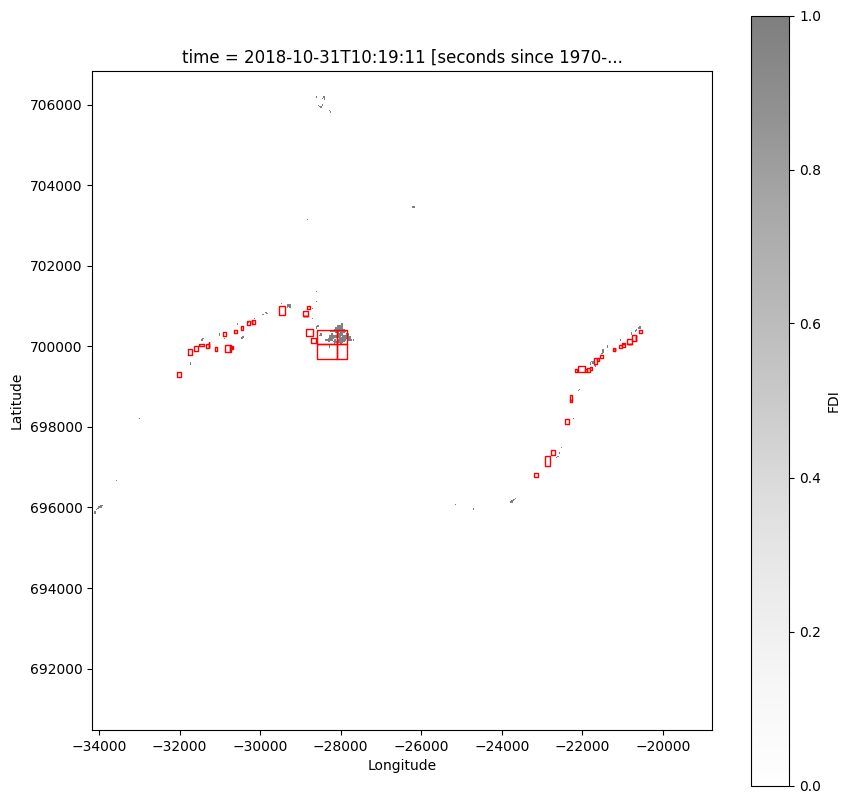

In [31]:
# Select a specific timestamp from the dataset
time_index = 0 # we have ground-trithing data for this timestamp
timestamp = ds_fdi.isel(time=time_index)

# Apply a threshold to create a binary mask
threshold = threshold_per_timestamp[time_index]
mask = timestamp >= threshold

# Remove microplastic areas that exist in any other timestamp
for j in range(len(ds_fdi.time.values)):
    if j == time_index:
        continue
    overlap = (ds_fdi.isel(time=j) >= threshold) & mask
    overlap_area = overlap.sum() * pixel_area
    if overlap_area > 0:
        mask = mask ^ overlap

# Plot the original timestamp with the mask overlayed on top
fig, ax = plt.subplots(figsize=(10, 10))
ax.set_title(f"Thresholded Microplastic Image - Time {ds_fdi.time.values[time_index]}")

# Plot the mask with the correct coordinates
mask.plot.imshow(ax=ax, cmap='Greys', alpha=0.5)

# Plot the marine debris dataset on top of the mask
marine_debris_dataset.plot(ax=ax, facecolor='none', edgecolor='red')

# Set the x and y axis labels
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

plt.show()
